Total files: 39
Files: ['landsat_water_mask_1987.tif', 'landsat_water_mask_1988.tif', 'landsat_water_mask_1989.tif', 'landsat_water_mask_1990.tif', 'landsat_water_mask_1991.tif'] ... ['landsat_water_mask_2021.tif', 'landsat_water_mask_2022.tif', 'landsat_water_mask_2023.tif', 'landsat_water_mask_2024.tif', 'landsat_water_mask_2025.tif']

Sample: landsat_water_mask_1987.tif
  Mode=L, Size=(3333, 1960), Shape=(1960, 3333)
  Dtype=uint8, Min=0, Max=1
  Unique: [0 1]

Loaded 38 years: [1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025]
Shape: 500x750
  1988: 3.1% water, sum=11609
  1989: 2.9% water, sum=10823
  1990: 2.9% water, sum=10931
  2023: 2.7% water, sum=10018
  2024: 2.7% water, sum=10052
  2025: 2.5% water, sum=9196


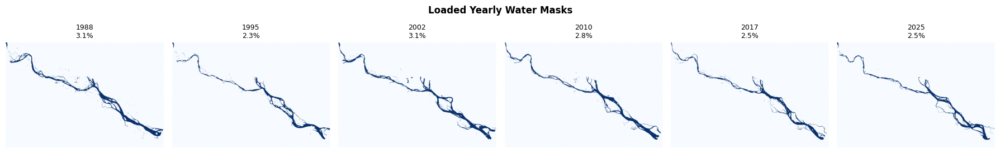


Missing 7 years: [2002, 2005, 2010, 2015, 2019, 2020, 2024]
Available 31 years: [1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2003, 2004, 2006, 2007, 2008, 2009, 2011, 2012, 2013, 2014, 2016, 2017, 2018, 2021, 2022, 2023, 2025]


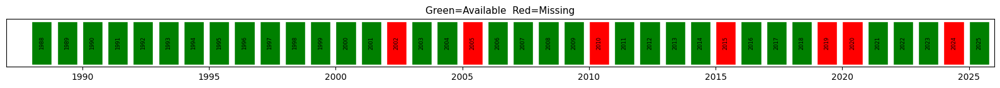


[1/7] Mean Composite...
  ✓ 2002: 10028 water px
[2/7] Median Composite...
  ✓ 2002: 10028 water px
[3/7] Linear Interpolation...
  ✓ 2002: 8325 water px
[4/7] Spline Interpolation...
  ✓ 2002: 11556 water px
[5/7] SDF Approach...
  ✓ 2002: 10598 water px
[6/7] Weighted Temporal...
  ✓ 2002: 10187 water px
[7/7] BiConvLSTM...
  Device: cuda
  Epoch 10/30, Loss: 0.04083
  Epoch 20/30, Loss: 0.03726
  Epoch 30/30, Loss: 0.03593


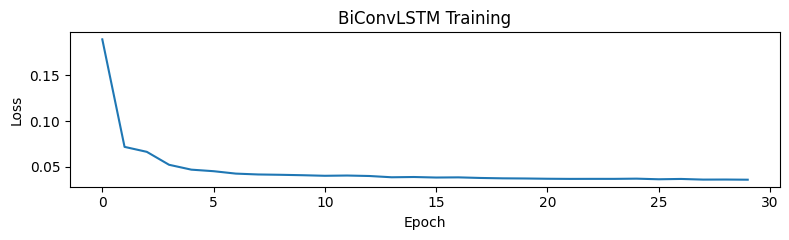

  Inference...
  ✓ 2002: 12098 water px

EVALUATION: IoU | Dice | Precision | Recall
  Mean         | IoU:0.6573 | Dice:0.7926 | Prec:0.8535 | Rec:0.7403
  Median       | IoU:0.6573 | Dice:0.7926 | Prec:0.8535 | Rec:0.7403
  Linear       | IoU:0.6548 | Dice:0.7910 | Prec:0.8913 | Rec:0.7193
  Spline       | IoU:0.6733 | Dice:0.8042 | Prec:0.8082 | Rec:0.8012
  SDF          | IoU:0.7290 | Dice:0.8429 | Prec:0.8741 | Rec:0.8161
  Weighted     | IoU:0.6724 | Dice:0.8035 | Prec:0.8306 | Rec:0.7790
  BiConvLSTM   | IoU:0.7366 | Dice:0.8477 | Prec:0.8457 | Rec:0.8511

✅ Best IoU:       BiConvLSTM
✅ Best Dice:      BiConvLSTM
✅ Best Precision: Linear
✅ Best Recall:    BiConvLSTM


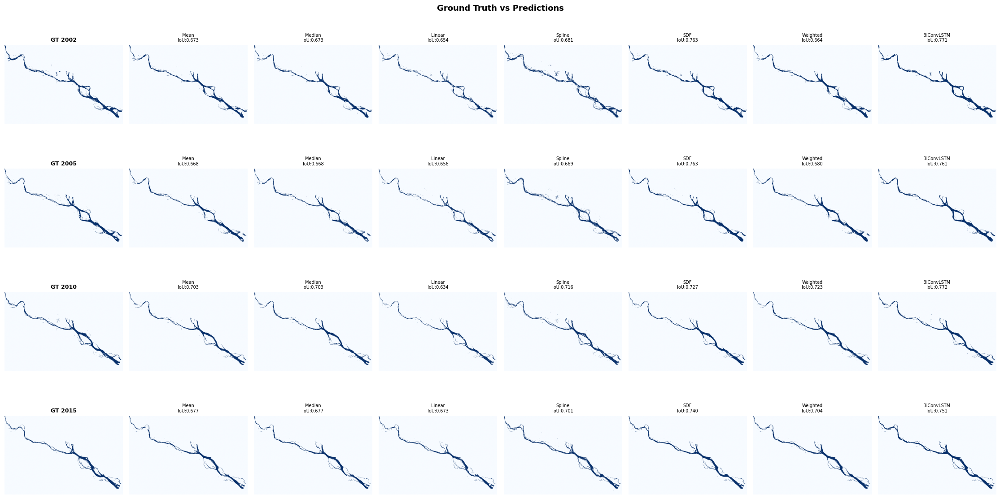

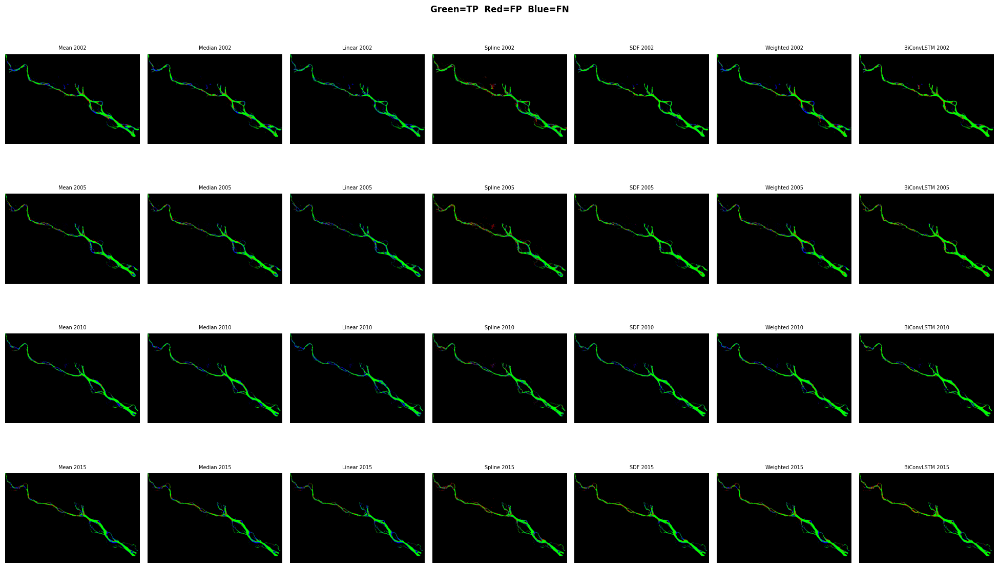

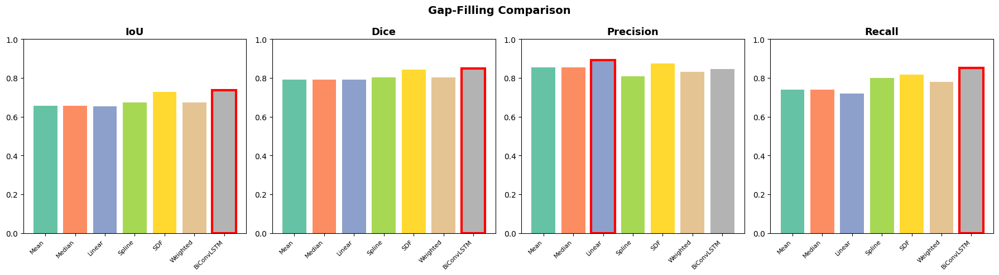


✅ PIPELINE COMPLETE


In [31]:
# ============================================================
# FULL PIPELINE: Gap-Filling for Yearly Water Masks (1988-2025)
# ============================================================
import os, re, warnings
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from scipy.interpolate import CubicSpline
from scipy.ndimage import distance_transform_edt
import pandas as pd

warnings.filterwarnings('ignore')

# ============================================================
# STEP 1: Load Yearly Water Masks
# ============================================================
folder = "/kaggle/input/datasets/kaoserahamed/riverbank/river"
image_exts = ('.png', '.jpg', '.jpeg', '.tif', '.tiff')
all_files = sorted([f for f in os.listdir(folder) if f.lower().endswith(image_exts)])

print(f"Total files: {len(all_files)}")
print("Files:", all_files[:5], "...", all_files[-5:])

# Check sample
sample = Image.open(os.path.join(folder, all_files[0]))
sample_arr = np.array(sample)
print(f"\nSample: {all_files[0]}")
print(f"  Mode={sample.mode}, Size={sample.size}, Shape={sample_arr.shape}")
print(f"  Dtype={sample_arr.dtype}, Min={sample_arr.min()}, Max={sample_arr.max()}")
print(f"  Unique: {np.unique(sample_arr).ravel()[:20]}")

# Extract year from filename
def extract_year(fname):
    match = re.search(r'(19[89]\d|20[0-2]\d)', fname)
    return int(match.group(1)) if match else None

# Downscale for speed — original ~2000x3000
RESIZE = (750, 500)  # (width, height)

def load_mask(path):
    img = Image.open(path).convert('L')
    img = img.resize(RESIZE, Image.NEAREST)
    arr = np.array(img, dtype=np.float32)
    if arr.max() > 1:
        arr = (arr > 127).astype(np.float32)  # threshold mid if 0-255
    else:
        arr = (arr > 0.5).astype(np.float32)
    return arr

# Load one image per year
data = {}
for f in all_files:
    y = extract_year(f)
    if y and 1988 <= y <= 2025 and y not in data:
        data[y] = load_mask(os.path.join(folder, f))

years = sorted(data.keys())
H, W = data[years[0]].shape
print(f"\nLoaded {len(years)} years: {years}")
print(f"Shape: {H}x{W}")

# Water % sanity check
for y in years[:3] + years[-3:]:
    print(f"  {y}: {data[y].mean()*100:.1f}% water, sum={data[y].sum():.0f}")

# Visualize
fig, axes = plt.subplots(1, min(6, len(years)), figsize=(18, 3))
show_idx = np.linspace(0, len(years)-1, min(6, len(years)), dtype=int)
for ax, idx in zip(axes, show_idx):
    y = years[idx]
    ax.imshow(data[y], cmap='Blues', vmin=0, vmax=1)
    ax.set_title(f'{y}\n{data[y].mean()*100:.1f}%', fontsize=9)
    ax.axis('off')
plt.suptitle('Loaded Yearly Water Masks', fontweight='bold')
plt.tight_layout(); plt.show()

# ============================================================
# STEP 2: Simulate 20% Missing
# ============================================================
np.random.seed(42)
n_missing = max(1, int(0.2 * len(years)))
removable = years[1:-1]
missing_years = sorted(np.random.choice(removable, size=min(n_missing, len(removable)), replace=False).tolist())

ground_truth = {y: data[y].copy() for y in missing_years}
available = {y: data[y] for y in years if y not in missing_years}
available_years = sorted(available.keys())

print(f"\nMissing {len(missing_years)} years: {missing_years}")
print(f"Available {len(available_years)} years: {available_years}")

# Timeline
fig, ax = plt.subplots(figsize=(16, 1.5))
for y in years:
    c = 'red' if y in missing_years else 'green'
    ax.barh(0, 0.8, left=y, color=c, edgecolor='white', height=0.4)
    ax.text(y + 0.4, 0, str(y), ha='center', va='center', fontsize=6, rotation=90)
ax.set_xlim(years[0]-1, years[-1]+1); ax.set_yticks([])
ax.set_title('Green=Available  Red=Missing', fontsize=11)
plt.tight_layout(); plt.show()

# ============================================================
# STEP 3: Helper
# ============================================================
def get_neighbors(target, avail, k=3):
    av = sorted(avail.keys())
    return [y for y in av if y < target][-k:], [y for y in av if y > target][:k]

def binarize(arr, t=0.5):
    return (arr > t).astype(np.float32)

# ============================================================
# STEP 4: Method 1 — Mean Composite
# ============================================================
print("\n[1/7] Mean Composite...")
results_mean = {}
for y in missing_years:
    b, a = get_neighbors(y, available, 3)
    nbrs = np.stack([available[yr] for yr in b + a])
    results_mean[y] = binarize(nbrs.mean(0))
print(f"  ✓ {missing_years[0]}: {results_mean[missing_years[0]].sum():.0f} water px")

# ============================================================
# STEP 5: Method 2 — Median Composite
# ============================================================
print("[2/7] Median Composite...")
results_median = {}
for y in missing_years:
    b, a = get_neighbors(y, available, 3)
    nbrs = np.stack([available[yr] for yr in b + a])
    results_median[y] = binarize(np.median(nbrs, 0))
print(f"  ✓ {missing_years[0]}: {results_median[missing_years[0]].sum():.0f} water px")

# ============================================================
# STEP 6: Method 3 — Linear Interpolation
# ============================================================
print("[3/7] Linear Interpolation...")
results_linear = {}
for y in missing_years:
    av = sorted(available.keys())
    bef = [yr for yr in av if yr < y]
    aft = [yr for yr in av if yr > y]
    if bef and aft:
        yb, ya = bef[-1], aft[0]
        w = (y - yb) / (ya - yb)
        results_linear[y] = binarize((1 - w) * available[yb] + w * available[ya])
    elif bef:
        results_linear[y] = available[bef[-1]].copy()
    else:
        results_linear[y] = available[aft[0]].copy()
print(f"  ✓ {missing_years[0]}: {results_linear[missing_years[0]].sum():.0f} water px")

# ============================================================
# STEP 7: Method 4 — Spline Interpolation
# ============================================================
print("[4/7] Spline Interpolation...")
av_yrs = np.array(available_years)
stack = np.stack([available[y] for y in av_yrs]).reshape(len(av_yrs), -1)
tgt = np.array(missing_years)
filled = np.zeros((len(tgt), stack.shape[1]), dtype=np.float32)
for s in range(0, stack.shape[1], 10000):
    e = min(s + 10000, stack.shape[1])
    filled[:, s:e] = CubicSpline(av_yrs, stack[:, s:e], axis=0, extrapolate=True)(tgt)
results_spline = {y: binarize(np.clip(filled[i].reshape(H, W), 0, 1)) for i, y in enumerate(tgt)}
print(f"  ✓ {missing_years[0]}: {results_spline[missing_years[0]].sum():.0f} water px")

# ============================================================
# STEP 8: Method 5 — SDF Approach
# ============================================================
print("[5/7] SDF Approach...")
def compute_sdf(img):
    m = img.astype(bool)
    if m.all() or (~m).all():
        return np.zeros_like(img)
    return distance_transform_edt(m) - distance_transform_edt(~m)

results_sdf = {}
for y in missing_years:
    b, a = get_neighbors(y, available, 1)
    if b and a:
        yb, ya = b[-1], a[0]
        w = (y - yb) / (ya - yb)
        sdf = (1 - w) * compute_sdf(available[yb]) + w * compute_sdf(available[ya])
        results_sdf[y] = (sdf > 0).astype(np.float32)
    elif b:
        results_sdf[y] = available[b[-1]].copy()
    else:
        results_sdf[y] = available[a[0]].copy()
print(f"  ✓ {missing_years[0]}: {results_sdf[missing_years[0]].sum():.0f} water px")

# ============================================================
# STEP 9: Method 6 — Inverse-Distance Weighted
# ============================================================
print("[6/7] Weighted Temporal...")
results_weighted = {}
for y in missing_years:
    wts = np.array([1.0 / max(abs(yr - y), 0.5) for yr in available_years])
    wts /= wts.sum()
    result = sum(w * available[yr] for w, yr in zip(wts, available_years))
    results_weighted[y] = binarize(result)
print(f"  ✓ {missing_years[0]}: {results_weighted[missing_years[0]].sum():.0f} water px")

# ============================================================
# STEP 10: Method 7 — BiConvLSTM
# ============================================================
print("[7/7] BiConvLSTM...")
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"  Device: {device}")

class ConvLSTMCell(nn.Module):
    def __init__(self, ic, hc, k=3):
        super().__init__()
        self.hc = hc
        self.g = nn.Conv2d(ic + hc, 4 * hc, k, padding=k // 2)
    def forward(self, x, s):
        h, c = s
        g = self.g(torch.cat([x, h], 1))
        i, f, o, u = g.chunk(4, 1)
        i, f, o = torch.sigmoid(i), torch.sigmoid(f), torch.sigmoid(o)
        c = f * c + i * torch.tanh(u)
        h = o * torch.tanh(c)
        return h, c
    def init(self, B, H, W, d):
        return (torch.zeros(B, self.hc, H, W, device=d),
                torch.zeros(B, self.hc, H, W, device=d))

class BiCLSTM(nn.Module):
    def __init__(self, hid=32):
        super().__init__()
        self.fw = ConvLSTMCell(1, hid)
        self.bw = ConvLSTMCell(1, hid)
        self.head = nn.Sequential(nn.Conv2d(hid*2, hid, 3, padding=1), nn.ReLU(),
                                  nn.Conv2d(hid, 1, 1), nn.Sigmoid())
    def forward(self, seq, mask):
        B, T, C, Hh, Ww = seq.shape
        fh, fc = self.fw.init(B, Hh, Ww, seq.device); fs = []
        for t in range(T):
            fh, fc = self.fw(seq[:, t], (fh, fc)); fs.append(fh)
        bh, bc = self.bw.init(B, Hh, Ww, seq.device); bs = [None]*T
        for t in range(T-1, -1, -1):
            bh, bc = self.bw(seq[:, t], (bh, bc)); bs[t] = bh
        return torch.stack([self.head(torch.cat([fs[t], bs[t]], 1)) for t in range(T)], 1)

P = 128  # patch size

class GapDS(Dataset):
    def __init__(self, avail, n=400):
        self.s = []
        ay = sorted(avail.keys())
        Hh, Ww = list(avail.values())[0].shape
        for _ in range(n):
            r, c = np.random.randint(0, Hh-P), np.random.randint(0, Ww-P)
            ng = max(1, int(0.2 * len(ay)))
            gi = set(np.random.choice(range(1, len(ay)-1), ng, replace=False))
            sq, gt, mk = [], [], []
            for i, yr in enumerate(ay):
                p = avail[yr][r:r+P, c:c+P]
                gt.append(p)
                if i in gi: sq.append(np.zeros_like(p)); mk.append(0.)
                else: sq.append(p); mk.append(1.)
            self.s.append((np.stack(sq)[:,None].astype(np.float32),
                           np.stack(gt)[:,None].astype(np.float32),
                           np.array(mk, dtype=np.float32)))
    def __len__(self): return len(self.s)
    def __getitem__(self, i):
        a, b, c = self.s[i]
        return torch.from_numpy(a), torch.from_numpy(b), torch.from_numpy(c)

ds = GapDS(available, 300)
dl = DataLoader(ds, batch_size=4, shuffle=True)
model = BiCLSTM(32).to(device)
opt = torch.optim.Adam(model.parameters(), 1e-3)
bce = nn.BCELoss()

losses = []
for ep in range(30):
    model.train(); el = 0
    for sq, gt, mk in dl:
        sq, gt, mk = sq.to(device), gt.to(device), mk.to(device)
        pred = model(sq, mk)
        miss = (1 - mk).bool()
        loss = torch.tensor(0., device=device, requires_grad=True); cnt = 0
        for b in range(sq.shape[0]):
            for t in range(sq.shape[1]):
                if miss[b, t]:
                    loss = loss + bce(pred[b, t], gt[b, t]); cnt += 1
        if cnt > 0: loss = loss / cnt
        opt.zero_grad(); loss.backward(); opt.step()
        el += loss.item()
    losses.append(el / len(dl))
    if (ep+1) % 10 == 0: print(f"  Epoch {ep+1}/30, Loss: {losses[-1]:.5f}")

plt.figure(figsize=(8, 2.5))
plt.plot(losses); plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.title('BiConvLSTM Training'); plt.tight_layout(); plt.show()

# Tile inference
print("  Inference...")
def tile_predict(model, data, available, missing_years, tile=128, olap=16):
    allyr = sorted(data.keys()); avset = set(available.keys())
    res = {y: np.zeros((H, W), dtype=np.float64) for y in missing_years}
    cnt = {y: np.zeros((H, W), dtype=np.float64) for y in missing_years}
    step = tile - olap
    model.eval()
    with torch.no_grad():
        for r in range(0, H, step):
            for c in range(0, W, step):
                r1, c1 = min(r+tile, H), min(c+tile, W)
                pr = r1-tile if r1-r < tile else r
                pc = c1-tile if c1-c < tile else c
                sq, mk = [], []
                for yr in allyr:
                    p = data[yr][pr:pr+tile, pc:pc+tile]
                    if yr in avset: sq.append(p); mk.append(1.)
                    else: sq.append(np.zeros_like(p)); mk.append(0.)
                st = torch.from_numpy(np.stack(sq)[:,None].astype(np.float32)).unsqueeze(0).to(device)
                mt = torch.from_numpy(np.array(mk, dtype=np.float32)).unsqueeze(0).to(device)
                pr_out = model(st, mt)[0,:,0].cpu().numpy()
                for i, yr in enumerate(allyr):
                    if yr in missing_years:
                        res[yr][pr:pr+tile, pc:pc+tile] += pr_out[i]
                        cnt[yr][pr:pr+tile, pc:pc+tile] += 1.
    for y in missing_years:
        res[y] = binarize(np.clip(res[y] / np.maximum(cnt[y], 1), 0, 1))
    return res

results_convlstm = tile_predict(model, data, available, missing_years)
print(f"  ✓ {missing_years[0]}: {results_convlstm[missing_years[0]].sum():.0f} water px")

# ============================================================
# STEP 11: Evaluate — IoU, Dice, Precision, Recall
# ============================================================
print("\n" + "="*80)
print("EVALUATION: IoU | Dice | Precision | Recall")
print("="*80)

def evaluate(gt_dict, pred_dict, name):
    ious, dices, precs, recs = [], [], [], []
    for y in sorted(gt_dict.keys()):
        g, p = gt_dict[y].ravel(), pred_dict[y].ravel()
        tp = (g * p).sum(); fp = (p * (1-g)).sum(); fn = (g * (1-p)).sum()
        e = 1e-8
        ious.append(tp / (tp+fp+fn+e))
        dices.append(2*tp / (2*tp+fp+fn+e))
        precs.append(tp / (tp+fp+e))
        recs.append(tp / (tp+fn+e))
    return {'Method': name, 'IoU': np.mean(ious), 'Dice': np.mean(dices),
            'Precision': np.mean(precs), 'Recall': np.mean(recs)}

all_methods = {
    'Mean': results_mean, 'Median': results_median,
    'Linear': results_linear, 'Spline': results_spline,
    'SDF': results_sdf, 'Weighted': results_weighted,
    'BiConvLSTM': results_convlstm
}

metrics = []
for name, preds in all_methods.items():
    m = evaluate(ground_truth, preds, name)
    metrics.append(m)
    print(f"  {name:12s} | IoU:{m['IoU']:.4f} | Dice:{m['Dice']:.4f} | Prec:{m['Precision']:.4f} | Rec:{m['Recall']:.4f}")

df = pd.DataFrame(metrics)
print(f"\n✅ Best IoU:       {df.loc[df['IoU'].idxmax(), 'Method']}")
print(f"✅ Best Dice:      {df.loc[df['Dice'].idxmax(), 'Method']}")
print(f"✅ Best Precision: {df.loc[df['Precision'].idxmax(), 'Method']}")
print(f"✅ Best Recall:    {df.loc[df['Recall'].idxmax(), 'Method']}")

# ============================================================
# STEP 12: Visual Comparison
# ============================================================
n_show = min(4, len(missing_years))
show_yrs = missing_years[:n_show]
mnames = list(all_methods.keys())

fig, axes = plt.subplots(n_show, len(mnames)+1, figsize=(2.8*(len(mnames)+1), 3*n_show))
if n_show == 1: axes = axes[None, :]
for i, y in enumerate(show_yrs):
    axes[i, 0].imshow(ground_truth[y], cmap='Blues', vmin=0, vmax=1)
    axes[i, 0].set_title(f'GT {y}', fontsize=9, fontweight='bold')
    axes[i, 0].axis('off')
    for j, nm in enumerate(mnames):
        pred = all_methods[nm][y]
        g, p = ground_truth[y].ravel(), pred.ravel()
        iou = (g*p).sum() / ((g*p).sum() + (p*(1-g)).sum() + (g*(1-p)).sum() + 1e-8)
        axes[i, j+1].imshow(pred, cmap='Blues', vmin=0, vmax=1)
        axes[i, j+1].set_title(f'{nm}\nIoU:{iou:.3f}', fontsize=7)
        axes[i, j+1].axis('off')
plt.suptitle('Ground Truth vs Predictions', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

# Error maps
fig, axes = plt.subplots(n_show, len(mnames), figsize=(2.8*len(mnames), 3*n_show))
if n_show == 1: axes = axes[None, :]
for i, y in enumerate(show_yrs):
    for j, nm in enumerate(mnames):
        gt_y, pr_y = ground_truth[y], all_methods[nm][y]
        rgb = np.zeros((*gt_y.shape, 3))
        rgb[:,:,1] = (gt_y == 1) & (pr_y == 1)  # TP=green
        rgb[:,:,0] = (gt_y == 0) & (pr_y == 1)  # FP=red
        rgb[:,:,2] = (gt_y == 1) & (pr_y == 0)  # FN=blue
        axes[i, j].imshow(rgb)
        axes[i, j].set_title(f'{nm} {y}', fontsize=7)
        axes[i, j].axis('off')
plt.suptitle('Green=TP  Red=FP  Blue=FN', fontsize=12, fontweight='bold')
plt.tight_layout(); plt.show()

# ============================================================
# STEP 13: Bar Chart
# ============================================================
fig, axes = plt.subplots(1, 4, figsize=(18, 5))
colors = plt.cm.Set2(np.linspace(0, 1, len(df)))
for ax, met in zip(axes, ['IoU', 'Dice', 'Precision', 'Recall']):
    bars = ax.bar(range(len(df)), df[met], color=colors)
    ax.set_xticks(range(len(df)))
    ax.set_xticklabels(df['Method'], rotation=45, ha='right', fontsize=8)
    ax.set_title(met, fontsize=13, fontweight='bold')
    ax.set_ylim(0, 1)
    best = df[met].idxmax()
    bars[best].set_edgecolor('red'); bars[best].set_linewidth(3)
plt.suptitle('Gap-Filling Comparison', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

print("\n✅ PIPELINE COMPLETE")

Total images found: 152


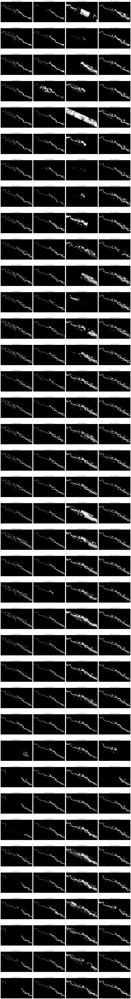

In [32]:
import os
import math
import matplotlib.pyplot as plt
import rasterio

# Folder containing all .tif images
folder_path = "/kaggle/input/datasets/kaoserahamed/quarterly-water-masks/Quarterly/full_quarterly"

# Get all TIFF files
image_files = sorted([
    f for f in os.listdir(folder_path)
    if f.endswith(".tif")
])

print(f"Total images found: {len(image_files)}")

# Number of columns for grid
cols = 4
rows = math.ceil(len(image_files) / cols)

# Create figure
plt.figure(figsize=(20, rows * 4))

for i, file in enumerate(image_files):
    file_path = os.path.join(folder_path, file)

    # Read TIFF image
    with rasterio.open(file_path) as src:
        img = src.read(1)  # Read first band

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap="gray")
    plt.title(file.replace(".tif", ""), fontsize=9)
    plt.axis("off")

plt.tight_layout()
plt.show()

Total possible quarterly slots: 152
Total missing quarters to fill: 22

Total TIFF files found: 152
Loaded 152 images, shape: 340×512
  Removing partial: 1988-Q3
  Removing partial: 1989-Q3
  Removing partial: 1990-Q3
  Removing partial: 1991-Q3
  Removing partial: 1992-Q3
  Removing partial: 1993-Q3
  Removing partial: 1994-Q3
  Removing partial: 1995-Q3
  Removing partial: 1996-Q3
  Removing partial: 1997-Q3
  Removing partial: 1998-Q3
  Removing partial: 1999-Q3
  Removing partial: 2001-Q3
  Removing partial: 2010-Q2
  Removing partial: 2016-Q1
  Removing partial: 2016-Q4
  Removing partial: 2017-Q1
  Removing partial: 2017-Q4
  Removing partial: 2019-Q1
  Removing partial: 2021-Q1
  Removing partial: 2023-Q1
  Removing partial: 2025-Q1

Available: 130 quarters
To fill: 22 quarters
Sequence shape: (152, 340, 512)
Available steps: 130
Missing steps: 22


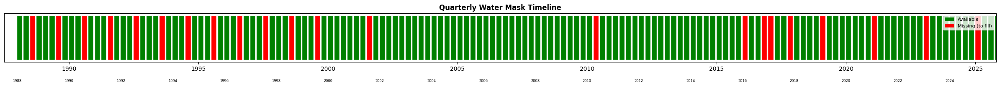


TRAINING BiConvLSTM (Memory-Optimized)
  Window: 12 quarters | Patch: 64×64
  Hidden: 24 | Batch: 2
  Epochs: 40 | Samples: 400

📦 Creating training dataset...
  Created 400 training samples (window=12, patch=64)
🧠 Model parameters: 93,793
   GPU allocated after model load: 23.1 MB

🚀 Training...
  Epoch   5/40 | Loss: 0.38421 | Best: 0.38421 | GPU: 12MB
  Epoch  10/40 | Loss: 0.36966 | Best: 0.36966 | GPU: 12MB
  Epoch  15/40 | Loss: 0.36151 | Best: 0.36151 | GPU: 12MB
  Epoch  20/40 | Loss: 0.35449 | Best: 0.35449 | GPU: 12MB
  Epoch  25/40 | Loss: 0.34956 | Best: 0.34953 | GPU: 12MB
  Epoch  30/40 | Loss: 0.34749 | Best: 0.34709 | GPU: 12MB
  Epoch  35/40 | Loss: 0.34352 | Best: 0.34256 | GPU: 12MB
  Epoch  40/40 | Loss: 0.34231 | Best: 0.34175 | GPU: 12MB


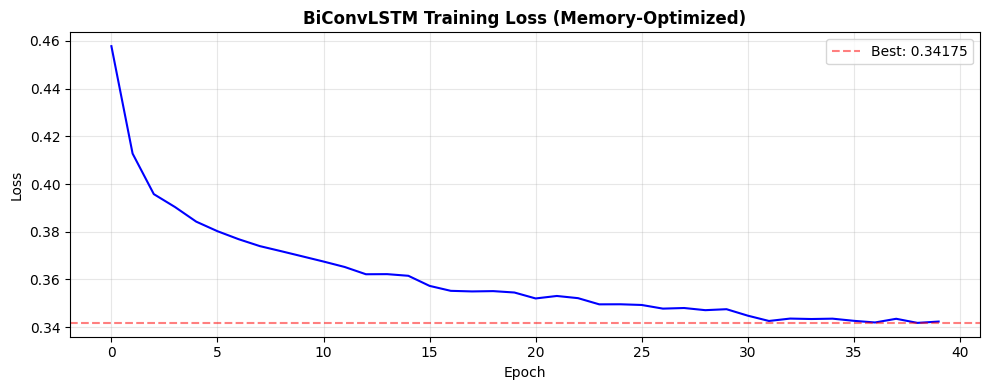


INFERENCE: Filling Missing Quarters

🔮 Running inference...
  Tiles: 7×11 = 77
  Windows: 13
  Total operations: 1001
  Window 1/13: t=[0:12], filling 3 gaps
  Window 2/13: t=[8:20], filling 3 gaps
  Window 3/13: t=[16:28], filling 3 gaps
  Window 4/13: t=[24:36], filling 3 gaps
  Window 5/13: t=[32:44], filling 3 gaps
  Window 6/13: t=[40:52], filling 2 gaps
  Window 7/13: t=[48:60], filling 1 gaps
    Progress: 500/1001 (50%) | GPU: 12MB
  Window 8/13: t=[83:95], filling 1 gaps
  Window 9/13: t=[106:118], filling 3 gaps
  Window 10/13: t=[113:125], filling 4 gaps
  Window 11/13: t=[126:138], filling 1 gaps
  Window 12/13: t=[134:146], filling 1 gaps
  Window 13/13: t=[140:152], filling 2 gaps
    Progress: 1000/1001 (100%) | GPU: 12MB
  ✅ 1988-Q3: 4.1% water
  ✅ 1989-Q3: 4.3% water
  ✅ 1990-Q3: 4.1% water
  ✅ 1991-Q3: 4.4% water
  ✅ 1992-Q3: 3.7% water
  ✅ 1993-Q3: 3.5% water
  ✅ 1994-Q3: 3.4% water
  ✅ 1995-Q3: 3.8% water
  ✅ 1996-Q3: 4.0% water
  ✅ 1997-Q3: 4.1% water
  ✅ 1998-Q3:

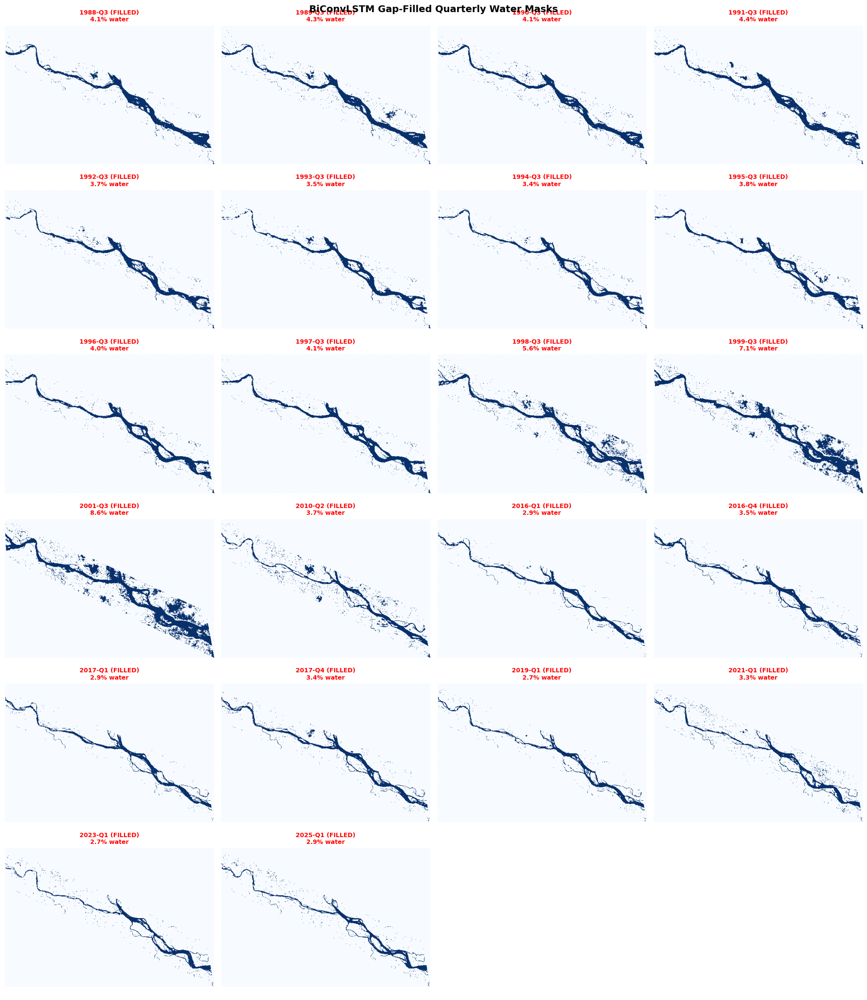

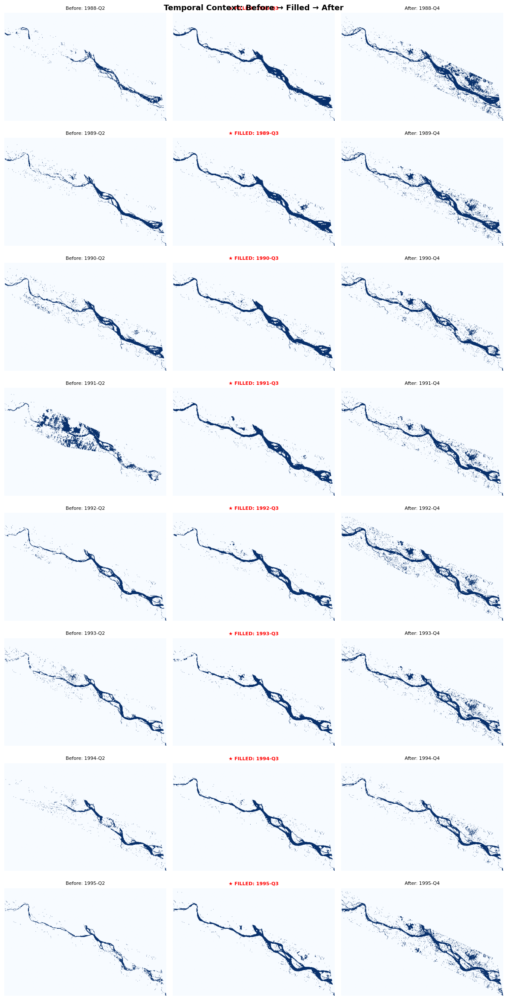

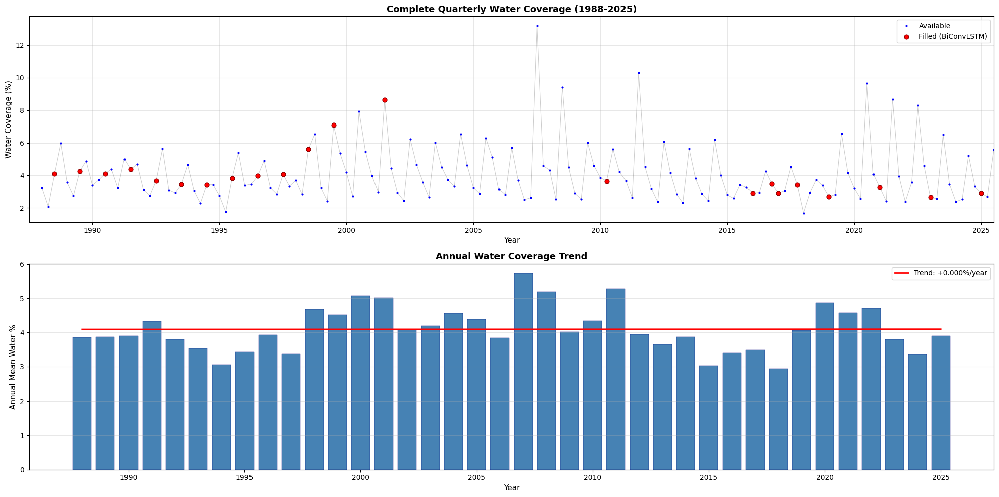

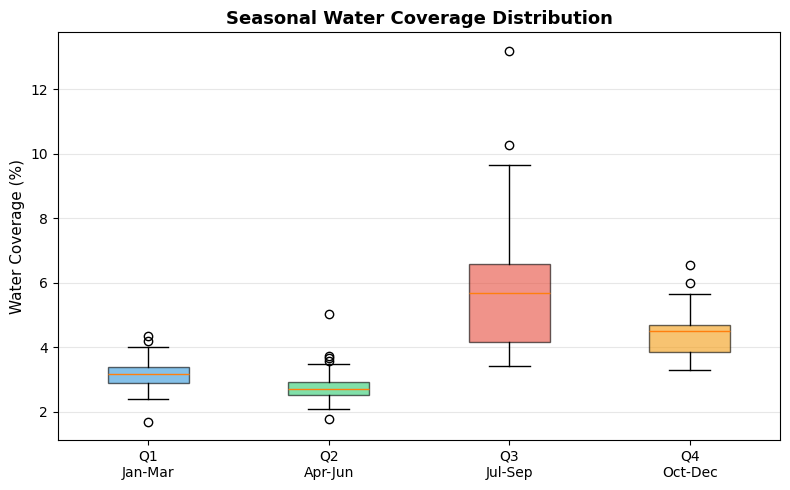


SAVING RESULTS
  💾 1988_Q3_filled_biconvlstm.tif
  💾 1989_Q3_filled_biconvlstm.tif
  💾 1990_Q3_filled_biconvlstm.tif
  💾 1991_Q3_filled_biconvlstm.tif
  💾 1992_Q3_filled_biconvlstm.tif
  💾 1993_Q3_filled_biconvlstm.tif
  💾 1994_Q3_filled_biconvlstm.tif
  💾 1995_Q3_filled_biconvlstm.tif
  💾 1996_Q3_filled_biconvlstm.tif
  💾 1997_Q3_filled_biconvlstm.tif
  💾 1998_Q3_filled_biconvlstm.tif
  💾 1999_Q3_filled_biconvlstm.tif
  💾 2001_Q3_filled_biconvlstm.tif
  💾 2010_Q2_filled_biconvlstm.tif
  💾 2016_Q1_filled_biconvlstm.tif
  💾 2016_Q4_filled_biconvlstm.tif
  💾 2017_Q1_filled_biconvlstm.tif
  💾 2017_Q4_filled_biconvlstm.tif
  💾 2019_Q1_filled_biconvlstm.tif
  💾 2021_Q1_filled_biconvlstm.tif
  💾 2023_Q1_filled_biconvlstm.tif
  💾 2025_Q1_filled_biconvlstm.tif

💾 Filled images: /kaggle/working/filled_quarterly (22 files)
💾 Complete dataset: /kaggle/working/complete_quarterly (152 files)
💾 Time series CSV: /kaggle/working/water_coverage_timeseries.csv
💾 Model checkpoint: /kaggle/working/biconv

In [35]:
# ============================================================
# MEMORY-OPTIMIZED BiConvLSTM Gap-Filling Pipeline
# For Quarterly Water Masks (1988-2025)
# Designed for Kaggle T4 GPU (16GB VRAM)
# ============================================================

import os
import re
import math
import gc
import warnings
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
import rasterio

warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# ============================================================
# STEP 1: Define Temporal Grid & Missing Quarters
# ============================================================

all_year_quarters = []
for year in range(1988, 2026):
    for q in range(1, 5):
        all_year_quarters.append((year, q))

# Missing/partial quarters to treat as fully missing
missing_quarters = set()

# Q3 of first 12 years (1988-1999)
for year in range(1988, 2000):
    missing_quarters.add((year, 3))

# Individual missing quarters
individual_missing = [
    (2001, 3), (2010, 2), (2016, 1), (2016, 4),
    (2017, 1), (2017, 4), (2019, 1), (2021, 1),
    (2023, 1), (2025, 1)
]
for yq in individual_missing:
    missing_quarters.add(yq)

print(f"Total possible quarterly slots: {len(all_year_quarters)}")
print(f"Total missing quarters to fill: {len(missing_quarters)}")

# ============================================================
# STEP 2: Load Quarterly TIFF Images
# ============================================================

folder_path = "/kaggle/input/datasets/kaoserahamed/quarterly-water-masks/Quarterly/full_quarterly"

image_files = sorted([
    f for f in os.listdir(folder_path)
    if f.endswith(".tif")
])
print(f"\nTotal TIFF files found: {len(image_files)}")

def extract_year_quarter(fname):
    """Extract year and quarter from filename."""
    match = re.search(r'(\d{4})[_\-]?[Qq](\d)', fname)
    if match:
        return int(match.group(1)), int(match.group(2))
    match = re.search(r'(\d{4})[_\-](\d)(?:\D|$)', fname)
    if match:
        return int(match.group(1)), int(match.group(2))
    match = re.search(r'(19[89]\d|20[0-2]\d)', fname)
    if match:
        year = int(match.group(1))
        q_match = re.search(r'[Qq](\d)', fname)
        if q_match:
            return year, int(q_match.group(1))
    return None, None

# ============================================================
# KEY OPTIMIZATION 1: Smaller resize for memory savings
# ============================================================
RESIZE = (512, 340)  # Reduced from (750, 500)

def load_mask_rasterio(path):
    """Load, resize, and binarize water mask."""
    with rasterio.open(path) as src:
        img = src.read(1).astype(np.float32)
        profile = src.profile.copy()
        original_shape = img.shape
    
    pil_img = Image.fromarray(img)
    pil_img = pil_img.resize(RESIZE, Image.NEAREST)
    arr = np.array(pil_img, dtype=np.float32)
    
    if arr.max() > 1:
        arr = (arr > 127).astype(np.float32)
    else:
        arr = (arr > 0.5).astype(np.float32)
    
    return arr, profile, original_shape

# Load all available quarterly images
quarterly_data = {}
profiles = {}
original_shapes = {}

for f in image_files:
    year, quarter = extract_year_quarter(f)
    if year is None or quarter is None:
        print(f"  ⚠️ Could not parse: {f}")
        continue
    
    yq = (year, quarter)
    if yq not in quarterly_data:
        file_path = os.path.join(folder_path, f)
        arr, prof, orig_shape = load_mask_rasterio(file_path)
        quarterly_data[yq] = arr
        profiles[yq] = prof
        original_shapes[yq] = orig_shape

H, W = list(quarterly_data.values())[0].shape
print(f"Loaded {len(quarterly_data)} images, shape: {H}×{W}")

# Remove partial images from available data
partial_present = sorted([yq for yq in missing_quarters if yq in quarterly_data])
for yq in partial_present:
    print(f"  Removing partial: {yq[0]}-Q{yq[1]}")
    del quarterly_data[yq]

available_quarters = sorted(quarterly_data.keys())
all_missing = sorted(missing_quarters)

print(f"\nAvailable: {len(available_quarters)} quarters")
print(f"To fill: {len(all_missing)} quarters")

# ============================================================
# STEP 3: Build Temporal Sequence
# ============================================================

def yq_to_index(year, quarter):
    return (year - 1988) * 4 + (quarter - 1)

def index_to_yq(idx):
    year = 1988 + idx // 4
    quarter = (idx % 4) + 1
    return year, quarter

total_steps = (2025 - 1988 + 1) * 4  # 152

# Build complete sequence
full_sequence = np.zeros((total_steps, H, W), dtype=np.float32)
mask_available = np.zeros(total_steps, dtype=np.float32)

for yq, arr in quarterly_data.items():
    idx = yq_to_index(yq[0], yq[1])
    full_sequence[idx] = arr
    mask_available[idx] = 1.0

missing_indices = []
for yq in all_missing:
    idx = yq_to_index(yq[0], yq[1])
    missing_indices.append(idx)
    mask_available[idx] = 0.0

print(f"Sequence shape: {full_sequence.shape}")
print(f"Available steps: {int(mask_available.sum())}")
print(f"Missing steps: {len(missing_indices)}")

# ============================================================
# STEP 4: Visualize Timeline
# ============================================================

fig, ax = plt.subplots(figsize=(24, 2.5))
for year in range(1988, 2026):
    for q in range(1, 5):
        yq = (year, q)
        x = year + (q - 1) * 0.25
        if yq in missing_quarters:
            color = 'red'
        elif yq in quarterly_data:
            color = 'green'
        else:
            color = 'lightgray'
        ax.barh(0, 0.2, left=x, color=color, edgecolor='white', height=0.4, linewidth=0.3)

ax.set_xlim(1987.5, 2025.8)
ax.set_yticks([])
for y in range(1988, 2026, 2):
    ax.text(y, -0.4, str(y), ha='center', fontsize=6)

from matplotlib.patches import Patch
ax.legend(handles=[
    Patch(facecolor='green', label='Available'),
    Patch(facecolor='red', label='Missing (to fill)')
], loc='upper right', fontsize=8)
ax.set_title('Quarterly Water Mask Timeline', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================================
# STEP 5: MEMORY-OPTIMIZED BiConvLSTM Architecture
# ============================================================

class ConvLSTMCell_Lite(nn.Module):
    """Lightweight ConvLSTM cell — no BatchNorm to save memory."""
    def __init__(self, input_ch, hidden_ch, kernel_size=3):
        super().__init__()
        self.hidden_ch = hidden_ch
        self.gates = nn.Conv2d(
            input_ch + hidden_ch, 4 * hidden_ch, 
            kernel_size, padding=kernel_size // 2, bias=True
        )
    
    def forward(self, x, state):
        h, c = state
        g = self.gates(torch.cat([x, h], dim=1))
        i, f, o, u = g.chunk(4, dim=1)
        i = torch.sigmoid(i)
        f = torch.sigmoid(f + 1.0)  # Forget gate bias for stability
        o = torch.sigmoid(o)
        c_new = f * c + i * torch.tanh(u)
        h_new = o * torch.tanh(c_new)
        return h_new, c_new
    
    def init_state(self, B, Hh, Ww, device):
        return (
            torch.zeros(B, self.hidden_ch, Hh, Ww, device=device),
            torch.zeros(B, self.hidden_ch, Hh, Ww, device=device)
        )


class BiConvLSTM_Lite(nn.Module):
    """
    Memory-optimized Bi-directional ConvLSTM.
    
    Key optimizations:
    - Single LSTM layer (not 2)
    - Smaller hidden channels (24 instead of 48)
    - No BatchNorm inside LSTM
    - Checkpoint-friendly forward pass
    - Fuses only at missing timesteps (not all)
    """
    def __init__(self, hidden_ch=24):
        super().__init__()
        self.hidden_ch = hidden_ch
        
        # Simple input projection (1 channel image → hidden_ch)
        self.input_proj = nn.Sequential(
            nn.Conv2d(1, hidden_ch, 3, padding=1),
            nn.ReLU(inplace=True)
        )
        
        # Single forward and backward ConvLSTM cells
        self.fw_cell = ConvLSTMCell_Lite(hidden_ch, hidden_ch)
        self.bw_cell = ConvLSTMCell_Lite(hidden_ch, hidden_ch)
        
        # Lightweight output head
        self.head = nn.Sequential(
            nn.Conv2d(hidden_ch * 2, hidden_ch, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(hidden_ch, 1, 1),
            nn.Sigmoid()
        )
    
    def forward(self, seq, mask, return_indices=None):
        """
        Args:
            seq: (B, T, 1, H, W)
            mask: (B, T) - 1=available, 0=missing
            return_indices: list of timestep indices to return predictions for.
                           If None, returns all timesteps.
                           Setting this SAVES MEMORY by not computing head for all T.
        Returns:
            output: dict {t_index: (B, 1, H, W)} or (B, T, 1, H, W)
        """
        B, T, C, Hh, Ww = seq.shape
        
        # Project inputs
        projected = []
        for t in range(T):
            projected.append(self.input_proj(seq[:, t]))
        
        # Forward LSTM pass — store hidden states
        fh, fc = self.fw_cell.init_state(B, Hh, Ww, seq.device)
        fw_states = []
        for t in range(T):
            fh, fc = self.fw_cell(projected[t], (fh, fc))
            fw_states.append(fh)
        
        # Backward LSTM pass — store hidden states
        bh, bc = self.bw_cell.init_state(B, Hh, Ww, seq.device)
        bw_states = [None] * T
        for t in range(T - 1, -1, -1):
            bh, bc = self.bw_cell(projected[t], (bh, bc))
            bw_states[t] = bh
        
        # Free projected inputs
        del projected
        
        # Determine which timesteps to decode
        if return_indices is not None:
            # Only decode requested timesteps (SAVES MEMORY)
            results = {}
            for t in return_indices:
                fused = torch.cat([fw_states[t], bw_states[t]], dim=1)
                results[t] = self.head(fused)
                del fused
            
            # Free all states
            del fw_states, bw_states
            return results
        else:
            # Decode all timesteps
            outputs = []
            for t in range(T):
                fused = torch.cat([fw_states[t], bw_states[t]], dim=1)
                outputs.append(self.head(fused))
                del fused
            
            del fw_states, bw_states
            return torch.stack(outputs, dim=1)


# ============================================================
# STEP 6: Memory-Optimized Training Dataset
# ============================================================

# ============================================================
# KEY OPTIMIZATION 2: Smaller window + smaller patch + fewer samples
# ============================================================
WINDOW_SIZE = 12     # Reduced from 20 (3 years context)
PATCH_SIZE = 64      # Reduced from 128
HIDDEN_CH = 24       # Reduced from 48
BATCH_SIZE = 2       # Reduced from 4
NUM_SAMPLES = 400
NUM_EPOCHS = 40


class GapDataset_Lite(Dataset):
    """Memory-efficient training dataset."""
    def __init__(self, full_seq, mask_avail, window_size=12, 
                 patch_size=64, num_samples=400, mask_ratio=0.2):
        self.samples = []
        T_total, Hh, Ww = full_seq.shape
        P = patch_size
        
        created = 0
        attempts = 0
        max_attempts = num_samples * 5
        
        while created < num_samples and attempts < max_attempts:
            attempts += 1
            
            # Random spatial patch
            r = np.random.randint(0, max(1, Hh - P))
            c = np.random.randint(0, max(1, Ww - P))
            
            # Random temporal window
            start = np.random.randint(0, max(1, T_total - window_size))
            end = start + window_size
            
            window_mask = mask_avail[start:end].copy()
            avail_in_window = np.where(window_mask > 0)[0]
            
            if len(avail_in_window) < 3:
                continue
            
            window_seq = full_seq[start:end, r:r+P, c:c+P].copy()
            ground_truth = window_seq.copy()
            
            # Randomly mask some available timesteps
            n_to_mask = max(1, int(mask_ratio * len(avail_in_window)))
            maskable = avail_in_window[1:-1] if len(avail_in_window) > 2 else avail_in_window
            
            if len(maskable) == 0:
                continue
            
            mask_these = np.random.choice(
                maskable, size=min(n_to_mask, len(maskable)), replace=False
            )
            
            train_seq = window_seq.copy()
            train_mask = window_mask.copy()
            
            masked_local = []
            for idx in mask_these:
                train_seq[idx] = 0.0
                train_mask[idx] = 0.0
                masked_local.append(idx)
            
            self.samples.append((
                train_seq[:, None].astype(np.float32),
                ground_truth[:, None].astype(np.float32),
                train_mask.astype(np.float32),
                np.array(masked_local, dtype=np.int64)
            ))
            created += 1
        
        print(f"  Created {len(self.samples)} training samples "
              f"(window={window_size}, patch={patch_size})")
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        seq, gt, mask, masked_idx = self.samples[idx]
        return (
            torch.from_numpy(seq),
            torch.from_numpy(gt),
            torch.from_numpy(mask),
            torch.from_numpy(masked_idx)
        )


def collate_fn(batch):
    """Custom collate to handle variable-length masked indices."""
    seqs, gts, masks, masked_indices = zip(*batch)
    return (
        torch.stack(seqs),
        torch.stack(gts),
        torch.stack(masks),
        masked_indices  # Keep as tuple of tensors
    )


# ============================================================
# STEP 7: Training with Memory Optimization
# ============================================================

print("\n" + "=" * 70)
print("TRAINING BiConvLSTM (Memory-Optimized)")
print("=" * 70)
print(f"  Window: {WINDOW_SIZE} quarters | Patch: {PATCH_SIZE}×{PATCH_SIZE}")
print(f"  Hidden: {HIDDEN_CH} | Batch: {BATCH_SIZE}")
print(f"  Epochs: {NUM_EPOCHS} | Samples: {NUM_SAMPLES}")

clear_gpu()

# Create dataset
print("\n📦 Creating training dataset...")
train_dataset = GapDataset_Lite(
    full_sequence, mask_available,
    window_size=WINDOW_SIZE,
    patch_size=PATCH_SIZE,
    num_samples=NUM_SAMPLES,
    mask_ratio=0.25
)

train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=0, pin_memory=False, collate_fn=collate_fn
)

# Initialize model
model = BiConvLSTM_Lite(hidden_ch=HIDDEN_CH).to(device)
total_params = sum(p.numel() for p in model.parameters())
print(f"🧠 Model parameters: {total_params:,}")

# Memory estimate
if torch.cuda.is_available():
    allocated = torch.cuda.memory_allocated() / 1e6
    print(f"   GPU allocated after model load: {allocated:.1f} MB")

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)


def dice_loss(pred, target, smooth=1e-6):
    p = pred.reshape(-1)
    t = target.reshape(-1)
    inter = (p * t).sum()
    return 1 - (2 * inter + smooth) / (p.sum() + t.sum() + smooth)


# Training loop
train_losses = []
best_loss = float('inf')

print(f"\n🚀 Training...")
for epoch in range(NUM_EPOCHS):
    model.train()
    epoch_loss = 0
    num_batches = 0
    
    for seq, gt, mask, masked_indices_batch in train_loader:
        seq = seq.to(device)       # (B, T, 1, H, W)
        gt = gt.to(device)         # (B, T, 1, H, W)
        mask = mask.to(device)     # (B, T)
        
        # ========================================
        # KEY OPTIMIZATION 3: Only decode missing timesteps
        # ========================================
        # Collect all unique masked timestep indices across batch
        all_masked_t = set()
        for b_idx in range(len(masked_indices_batch)):
            for t in masked_indices_batch[b_idx].numpy():
                all_masked_t.add(int(t))
        
        if len(all_masked_t) == 0:
            continue
        
        all_masked_t = sorted(all_masked_t)
        
        # Forward pass — only return predictions for masked timesteps
        predictions = model(seq, mask, return_indices=all_masked_t)
        
        # Compute loss only on artificially masked timesteps
        loss = torch.tensor(0., device=device, requires_grad=True)
        count = 0
        
        for b_idx in range(seq.shape[0]):
            for t in masked_indices_batch[b_idx].numpy():
                t = int(t)
                if t in predictions:
                    pred_t = predictions[t][b_idx]  # (1, H, W)
                    gt_t = gt[b_idx, t]              # (1, H, W)
                    bce = nn.functional.binary_cross_entropy(pred_t, gt_t)
                    dl = dice_loss(pred_t, gt_t)
                    loss = loss + 0.5 * bce + 0.5 * dl
                    count += 1
        
        if count > 0:
            loss = loss / count
            optimizer.zero_grad()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            epoch_loss += loss.item()
            num_batches += 1
        
        # ========================================
        # KEY OPTIMIZATION 4: Explicit cleanup every batch
        # ========================================
        del predictions, seq, gt, mask, loss
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
    
    scheduler.step()
    avg_loss = epoch_loss / max(num_batches, 1)
    train_losses.append(avg_loss)
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        torch.save(model.state_dict(), 'best_biconvlstm_lite.pth')
    
    if (epoch + 1) % 5 == 0:
        mem = torch.cuda.memory_allocated() / 1e6 if torch.cuda.is_available() else 0
        print(f"  Epoch {epoch+1:3d}/{NUM_EPOCHS} | "
              f"Loss: {avg_loss:.5f} | Best: {best_loss:.5f} | "
              f"GPU: {mem:.0f}MB")

# Plot training curve
plt.figure(figsize=(10, 4))
plt.plot(train_losses, 'b-', linewidth=1.5)
plt.axhline(y=best_loss, color='r', linestyle='--', alpha=0.5, 
            label=f'Best: {best_loss:.5f}')
plt.xlabel('Epoch'); plt.ylabel('Loss')
plt.title('BiConvLSTM Training Loss (Memory-Optimized)', fontweight='bold')
plt.legend(); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

# ============================================================
# STEP 8: Memory-Optimized Tiled Inference
# ============================================================

print("\n" + "=" * 70)
print("INFERENCE: Filling Missing Quarters")
print("=" * 70)

# Load best model
model.load_state_dict(torch.load('best_biconvlstm_lite.pth'))
model.eval()
clear_gpu()


def tile_predict_optimized(model, full_seq, mask_avail, missing_idx,
                           tile_size=64, overlap=16, window_size=12):
    """
    Memory-optimized tiled inference.
    
    Key optimizations:
    - Small tiles (64×64)
    - Process one missing timestep group at a time
    - Explicit GPU cleanup between tiles
    - Only decode missing timesteps
    """
    T_total, Hh, Ww = full_seq.shape
    
    # Result buffers (on CPU)
    result_sum = {idx: np.zeros((Hh, Ww), dtype=np.float64) for idx in missing_idx}
    result_cnt = {idx: np.zeros((Hh, Ww), dtype=np.float64) for idx in missing_idx}
    
    step = tile_size - overlap
    
    # Compute tile grid
    row_starts = list(range(0, max(1, Hh - tile_size + 1), step))
    if row_starts[-1] + tile_size < Hh:
        row_starts.append(Hh - tile_size)
    
    col_starts = list(range(0, max(1, Ww - tile_size + 1), step))
    if col_starts[-1] + tile_size < Ww:
        col_starts.append(Ww - tile_size)
    
    # Group missing indices into temporal windows
    windows = []
    processed = set()
    
    for m_idx in sorted(missing_idx):
        if m_idx in processed:
            continue
        w_start = max(0, m_idx - window_size // 2)
        w_end = min(T_total, w_start + window_size)
        w_start = max(0, w_end - window_size)
        
        covered = [idx for idx in missing_idx if w_start <= idx < w_end]
        for c in covered:
            processed.add(c)
        windows.append((w_start, w_end, covered))
    
    total_ops = len(windows) * len(row_starts) * len(col_starts)
    print(f"  Tiles: {len(row_starts)}×{len(col_starts)} = "
          f"{len(row_starts)*len(col_starts)}")
    print(f"  Windows: {len(windows)}")
    print(f"  Total operations: {total_ops}")
    
    op_count = 0
    
    with torch.no_grad():
        for w_idx, (w_start, w_end, covered_missing) in enumerate(windows):
            # Which local timesteps are missing?
            local_missing = [m - w_start for m in covered_missing]
            
            print(f"  Window {w_idx+1}/{len(windows)}: "
                  f"t=[{w_start}:{w_end}], filling {len(covered_missing)} gaps")
            
            for r in row_starts:
                for c in col_starts:
                    # Extract spatial-temporal patch
                    patch = full_seq[w_start:w_end, r:r+tile_size, c:c+tile_size]
                    pmask = mask_avail[w_start:w_end]
                    
                    # To GPU tensors
                    seq_t = torch.from_numpy(
                        patch[:, None].astype(np.float32)
                    ).unsqueeze(0).to(device)
                    
                    mask_t = torch.from_numpy(
                        pmask.astype(np.float32)
                    ).unsqueeze(0).to(device)
                    
                    # Predict ONLY missing timesteps
                    preds = model(seq_t, mask_t, return_indices=local_missing)
                    
                    # Accumulate results (move to CPU immediately)
                    for local_t, global_t in zip(local_missing, covered_missing):
                        if local_t in preds:
                            pred_np = preds[local_t][0, 0].cpu().numpy()
                            result_sum[global_t][r:r+tile_size, c:c+tile_size] += pred_np
                            result_cnt[global_t][r:r+tile_size, c:c+tile_size] += 1.0
                    
                    # ========================================
                    # KEY OPTIMIZATION 5: Clean up EVERY tile
                    # ========================================
                    del seq_t, mask_t, preds
                    
                    op_count += 1
                    if op_count % 500 == 0:
                        torch.cuda.empty_cache() if torch.cuda.is_available() else None
                        mem = torch.cuda.memory_allocated() / 1e6 if torch.cuda.is_available() else 0
                        pct = op_count / total_ops * 100
                        print(f"    Progress: {op_count}/{total_ops} ({pct:.0f}%) | "
                              f"GPU: {mem:.0f}MB")
            
            # Clean up after each temporal window
            clear_gpu()
    
    # Average overlapping predictions and binarize
    filled = {}
    for m_idx in missing_idx:
        avg = result_sum[m_idx] / np.maximum(result_cnt[m_idx], 1.0)
        filled[m_idx] = (np.clip(avg, 0, 1) > 0.5).astype(np.float32)
    
    return filled


# Run inference
print("\n🔮 Running inference...")
filled_results = tile_predict_optimized(
    model, full_sequence, mask_available, missing_indices,
    tile_size=PATCH_SIZE, overlap=16, window_size=WINDOW_SIZE
)

# Convert to year-quarter format
filled_quarterly = {}
for idx, arr in filled_results.items():
    year, quarter = index_to_yq(idx)
    filled_quarterly[(year, quarter)] = arr
    water_pct = arr.mean() * 100
    print(f"  ✅ {year}-Q{quarter}: {water_pct:.1f}% water")

clear_gpu()

# ============================================================
# STEP 9: Build Complete Dataset
# ============================================================

print("\n" + "=" * 70)
print("COMPLETE QUARTERLY DATASET")
print("=" * 70)

complete_quarterly = {}
for yq, arr in quarterly_data.items():
    complete_quarterly[yq] = arr
for yq, arr in filled_quarterly.items():
    complete_quarterly[yq] = arr

complete_sorted = sorted(complete_quarterly.keys())
print(f"Total images: {len(complete_sorted)}")

# Print coverage
print(f"\n{'Year':>6} | Q1   Q2   Q3   Q4  | Source")
print("-" * 50)
for year in range(1988, 2026):
    statuses = []
    sources = []
    for q in range(1, 5):
        yq = (year, q)
        if yq in filled_quarterly:
            statuses.append('✅')
            sources.append('F')
        elif yq in quarterly_data:
            statuses.append('✅')
            sources.append('A')
        else:
            statuses.append('❌')
            sources.append('-')
    print(f"  {year} | {statuses[0]}   {statuses[1]}   {statuses[2]}   {statuses[3]}  "
          f"| {' '.join(sources)}")

# ============================================================
# STEP 10: Visualize All Filled Images
# ============================================================

n_filled = len(filled_quarterly)
cols_vis = 4
rows_vis = math.ceil(n_filled / cols_vis)

fig, axes = plt.subplots(rows_vis, cols_vis, figsize=(18, rows_vis * 3.5))
if rows_vis == 1:
    axes = axes[None, :]

for i, (yq, arr) in enumerate(sorted(filled_quarterly.items())):
    r, c = divmod(i, cols_vis)
    axes[r, c].imshow(arr, cmap='Blues', vmin=0, vmax=1)
    axes[r, c].set_title(
        f'{yq[0]}-Q{yq[1]} (FILLED)\n{arr.mean()*100:.1f}% water',
        fontsize=9, fontweight='bold', color='red'
    )
    axes[r, c].axis('off')

for i in range(n_filled, rows_vis * cols_vis):
    r, c = divmod(i, cols_vis)
    axes[r, c].axis('off')

plt.suptitle('BiConvLSTM Gap-Filled Quarterly Water Masks',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================================
# STEP 11: Temporal Context Visualization
# ============================================================

n_context = min(8, n_filled)
fig, axes = plt.subplots(n_context, 3, figsize=(12, n_context * 3))
if n_context == 1:
    axes = axes[None, :]

for i, (yq, arr) in enumerate(sorted(filled_quarterly.items())[:n_context]):
    idx = yq_to_index(yq[0], yq[1])
    
    # Find nearest before
    before_yq = None
    for j in range(idx - 1, -1, -1):
        byq = index_to_yq(j)
        if byq in quarterly_data:
            before_yq = byq
            break
    
    # Find nearest after
    after_yq = None
    for j in range(idx + 1, total_steps):
        ayq = index_to_yq(j)
        if ayq in quarterly_data:
            after_yq = ayq
            break
    
    if before_yq:
        axes[i, 0].imshow(quarterly_data[before_yq], cmap='Blues', vmin=0, vmax=1)
        axes[i, 0].set_title(f'Before: {before_yq[0]}-Q{before_yq[1]}', fontsize=8)
    else:
        axes[i, 0].text(0.5, 0.5, 'No prior', ha='center', va='center',
                         transform=axes[i, 0].transAxes)
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(arr, cmap='Blues', vmin=0, vmax=1)
    axes[i, 1].set_title(f'★ FILLED: {yq[0]}-Q{yq[1]}', fontsize=8,
                          fontweight='bold', color='red')
    axes[i, 1].axis('off')
    
    if after_yq:
        axes[i, 2].imshow(quarterly_data[after_yq], cmap='Blues', vmin=0, vmax=1)
        axes[i, 2].set_title(f'After: {after_yq[0]}-Q{after_yq[1]}', fontsize=8)
    else:
        axes[i, 2].text(0.5, 0.5, 'No later', ha='center', va='center',
                         transform=axes[i, 2].transAxes)
    axes[i, 2].axis('off')

plt.suptitle('Temporal Context: Before → Filled → After', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# ============================================================
# STEP 12: Water Area Time Series
# ============================================================

time_series = []
for yq in sorted(complete_quarterly.keys()):
    year, quarter = yq
    water_pct = complete_quarterly[yq].mean() * 100
    source = 'Filled' if yq in filled_quarterly else 'Available'
    time_series.append({
        'Year': year, 'Quarter': quarter,
        'YearQ': year + (quarter - 1) * 0.25,
        'Water_Pct': water_pct, 'Source': source
    })

ts_df = pd.DataFrame(time_series)

fig, axes = plt.subplots(2, 1, figsize=(20, 10))

# Top: Full time series
ax = axes[0]
avail_df = ts_df[ts_df['Source'] == 'Available']
filled_df = ts_df[ts_df['Source'] == 'Filled']

ax.plot(ts_df['YearQ'], ts_df['Water_Pct'], 'gray', alpha=0.4, linewidth=0.8)
ax.plot(avail_df['YearQ'], avail_df['Water_Pct'], 'b.', markersize=4, label='Available')
ax.scatter(filled_df['YearQ'], filled_df['Water_Pct'],
           color='red', s=40, zorder=5, label='Filled (BiConvLSTM)', edgecolors='darkred')
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel('Water Coverage (%)', fontsize=11)
ax.set_title('Complete Quarterly Water Coverage (1988-2025)', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)
ax.set_xlim(1987.5, 2025.5)

# Bottom: Annual mean trend
ax = axes[1]
annual = ts_df.groupby('Year')['Water_Pct'].mean()
ax.bar(annual.index, annual.values, color='steelblue', edgecolor='navy', linewidth=0.3)
z = np.polyfit(annual.index, annual.values, 1)
ax.plot(annual.index, np.polyval(z, annual.index), 'r-', linewidth=2,
        label=f'Trend: {z[0]:+.3f}%/year')
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel('Annual Mean Water %', fontsize=11)
ax.set_title('Annual Water Coverage Trend', fontsize=13, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Seasonal box plot
fig, ax = plt.subplots(figsize=(8, 5))
quarter_data = [ts_df[ts_df['Quarter'] == q]['Water_Pct'].values for q in range(1, 5)]
bp = ax.boxplot(quarter_data, labels=['Q1\nJan-Mar', 'Q2\nApr-Jun',
                                       'Q3\nJul-Sep', 'Q4\nOct-Dec'],
                patch_artist=True)
colors_q = ['#3498db', '#2ecc71', '#e74c3c', '#f39c12']
for patch, color in zip(bp['boxes'], colors_q):
    patch.set_facecolor(color)
    patch.set_alpha(0.6)
ax.set_ylabel('Water Coverage (%)', fontsize=11)
ax.set_title('Seasonal Water Coverage Distribution', fontsize=13, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.show()

# ============================================================
# STEP 13: Save Results
# ============================================================

print("\n" + "=" * 70)
print("SAVING RESULTS")
print("=" * 70)

# Save filled images
output_filled = "/kaggle/working/filled_quarterly"
os.makedirs(output_filled, exist_ok=True)

ref_profile = list(profiles.values())[0] if profiles else None

for yq in sorted(filled_quarterly.keys()):
    year, quarter = yq
    fname = f"{year}_Q{quarter}_filled_biconvlstm.tif"
    fpath = os.path.join(output_filled, fname)
    
    if ref_profile:
        prof = ref_profile.copy()
        prof.update(dtype='float32', count=1, height=H, width=W, compress='lzw')
    else:
        prof = {'driver': 'GTiff', 'dtype': 'float32',
                'width': W, 'height': H, 'count': 1, 'compress': 'lzw'}
    
    with rasterio.open(fpath, 'w', **prof) as dst:
        dst.write(filled_quarterly[yq].astype(np.float32), 1)
    
    print(f"  💾 {fname}")

# Save complete dataset
output_complete = "/kaggle/working/complete_quarterly"
os.makedirs(output_complete, exist_ok=True)

for yq in sorted(complete_quarterly.keys()):
    year, quarter = yq
    source = 'filled' if yq in filled_quarterly else 'original'
    fname = f"{year}_Q{quarter}_{source}.tif"
    fpath = os.path.join(output_complete, fname)
    
    if ref_profile:
        prof = ref_profile.copy()
        prof.update(dtype='float32', count=1, height=H, width=W, compress='lzw')
    else:
        prof = {'driver': 'GTiff', 'dtype': 'float32',
                'width': W, 'height': H, 'count': 1, 'compress': 'lzw'}
    
    with rasterio.open(fpath, 'w', **prof) as dst:
        dst.write(complete_quarterly[yq].astype(np.float32), 1)

# Save time series CSV
ts_df.to_csv('/kaggle/working/water_coverage_timeseries.csv', index=False)

# Save model
torch.save({
    'model_state_dict': model.state_dict(),
    'config': {
        'hidden_ch': HIDDEN_CH,
        'window_size': WINDOW_SIZE,
        'patch_size': PATCH_SIZE,
        'resize': RESIZE,
        'best_loss': best_loss
    }
}, '/kaggle/working/biconvlstm_gapfiller_model.pth')

print(f"\n💾 Filled images: {output_filled} ({len(filled_quarterly)} files)")
print(f"💾 Complete dataset: {output_complete} ({len(complete_quarterly)} files)")
print(f"💾 Time series CSV: /kaggle/working/water_coverage_timeseries.csv")
print(f"💾 Model checkpoint: /kaggle/working/biconvlstm_gapfiller_model.pth")

# ============================================================
# STEP 14: Summary
# ============================================================

print("\n" + "=" * 70)
print("📋 FINAL SUMMARY")
print("=" * 70)
print(f"  {'Year range':<30} 1988-2025")
print(f"  {'Available images':<30} {len(available_quarters)}")
print(f"  {'Gaps filled':<30} {len(filled_quarterly)}")
print(f"  {'Complete dataset':<30} {len(complete_quarterly)} images")
print(f"  {'Image size (processed)':<30} {H}×{W}")
print(f"  {'Model':<30} BiConvLSTM ({total_params:,} params)")
print(f"  {'Hidden channels':<30} {HIDDEN_CH}")
print(f"  {'Temporal window':<30} {WINDOW_SIZE} quarters")
print(f"  {'Spatial patch':<30} {PATCH_SIZE}×{PATCH_SIZE}")
print(f"  {'Training loss (best)':<30} {best_loss:.5f}")
print(f"  {'Training epochs':<30} {NUM_EPOCHS}")

# Water statistics
print(f"\n  Water Coverage Statistics:")
for source in ['Available', 'Filled']:
    sub = ts_df[ts_df['Source'] == source]['Water_Pct']
    if len(sub) > 0:
        print(f"    {source:>10}: mean={sub.mean():.1f}%, "
              f"std={sub.std():.1f}%, "
              f"range=[{sub.min():.1f}%, {sub.max():.1f}%]")

print(f"\n✅ PIPELINE COMPLETE — {len(filled_quarterly)} quarterly gaps filled!")

In [36]:
# ============================================================
# ZIP Complete Dataset & Download
# ============================================================

import os
import zipfile
from IPython.display import FileLink

# Output folder where filled + original images were saved
complete_folder = "/kaggle/working/complete_quarterly"
zip_path = "/kaggle/working/complete_quarterly_1988_2025.zip"

# Create ZIP
print("📦 Zipping...")
with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zf:
    for f in sorted(os.listdir(complete_folder)):
        if f.endswith('.tif'):
            zf.write(os.path.join(complete_folder, f), f)

size_mb = os.path.getsize(zip_path) / 1e6
print(f"✅ Done! {zip_path} ({size_mb:.1f} MB)")

# Download link
FileLink('complete_quarterly_1988_2025.zip')

📦 Zipping...
✅ Done! /kaggle/working/complete_quarterly_1988_2025.zip (1.2 MB)


/kaggle/working/complete_quarterly_1988_2025.zip

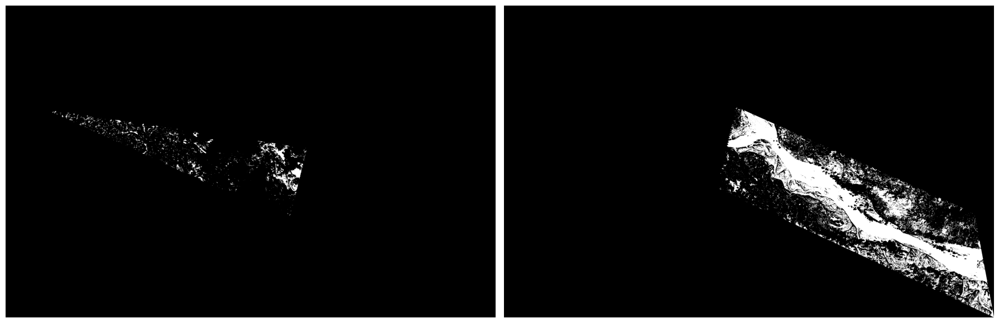

In [2]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# ===============================
# CONFIG (EDIT THESE TWO INDEXES)
# ===============================
idx1 = 6   # change manually
idx2 = 10  # change manually

folder = "/kaggle/input/datasets/kaoserahamed/quarterly-water-masks/Quarterly/full_quarterly"

# Get sorted image list
image_exts = ('.png', '.jpg', '.jpeg', '.tif', '.tiff')
all_files = sorted([f for f in os.listdir(folder) if f.lower().endswith(image_exts)])

# ===============================
# LOAD IMAGES (HIGH RESOLUTION)
# ===============================
img1_path = os.path.join(folder, all_files[idx1])
img2_path = os.path.join(folder, all_files[idx2])

img1 = Image.open(img1_path)
img2 = Image.open(img2_path)

# ===============================
# DISPLAY SIDE-BY-SIDE
# ===============================
plt.figure(figsize=(18, 8))  # large figure for high resolution

plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray')
#plt.title(f"Image {idx1}: {all_files[idx1]}", fontsize=10)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2, cmap='gray')
#plt.title(f"Image {idx2}: {all_files[idx2]}", fontsize=10)
plt.axis('off')

plt.tight_layout()
plt.show()